## Introduction

In the [previous notebook](2025-12-24-minimal-vlm-from-scratch.html), we built a minimal Vision-Language Model (VLM) from scratch and trained it on image captioning. The model learned to describe images in natural language.

Now, let's take it a step further: **instruction fine-tuning** for object detection. Instead of just describing an image, we'll teach the model to:

1. Understand questions like *"What objects are in this image?"*
2. Output structured JSON with bounding box coordinates
3. Identify object categories

This is similar to how models like Kosmos-2 and Florence-2 handle visual grounding tasks.

### Output Format

We'll train the model to output JSON like:
```json
{"objects": [{"label": "cat", "bbox": [x, y, w, h]}, {"label": "dog", "bbox": [x, y, w, h]}]}
```

Where `bbox` contains normalized coordinates (0-1 range).

## Setup

In [ ]:
!uv pip install -q transformers datasets torch torchvision pillow accelerate einops timm supervision

In [20]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
from transformers import (
    AutoModelForCausalLM,
    AutoTokenizer,
    ViTModel,
    ViTImageProcessor,
)
from datasets import load_dataset
from PIL import Image
import numpy as np
import requests
from io import BytesIO
import matplotlib.pyplot as plt
from tqdm.auto import tqdm
import json
import textwrap
import os
import warnings
warnings.filterwarnings('ignore')

# Import supervision for visualization
import supervision as sv

%config InlineBackend.figure_format = 'retina'

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


## Part 1: Load the Pretrained VLM

We'll load our VLM from the previous notebook. If you haven't run that notebook yet, we'll recreate the model from scratch.

In [21]:
# First, let's define the model architecture (same as previous notebook)

class VisionProjector(nn.Module):
    """Projects vision features into the language model's embedding space."""
    
    def __init__(self, vision_dim: int, language_dim: int):
        super().__init__()
        self.projection = nn.Sequential(
            nn.Linear(vision_dim, language_dim),
            nn.GELU(),
            nn.LayerNorm(language_dim),
            nn.Linear(language_dim, language_dim),
        )
    
    def forward(self, vision_features: torch.Tensor) -> torch.Tensor:
        return self.projection(vision_features)


class MiniVLM(nn.Module):
    """A minimal Vision-Language Model."""
    
    def __init__(
        self,
        vision_encoder: ViTModel,
        language_model: AutoModelForCausalLM,
        projector: VisionProjector,
        tokenizer: AutoTokenizer,
    ):
        super().__init__()
        self.vision_encoder = vision_encoder
        self.language_model = language_model
        self.projector = projector
        self.tokenizer = tokenizer
        
        for param in self.vision_encoder.parameters():
            param.requires_grad = False
    
    def encode_image(self, pixel_values: torch.Tensor) -> torch.Tensor:
        with torch.no_grad():
            vision_outputs = self.vision_encoder(pixel_values=pixel_values)
        image_features = vision_outputs.last_hidden_state
        projected = self.projector(image_features)
        return projected
    
    def forward(
        self,
        pixel_values: torch.Tensor,
        input_ids: torch.Tensor,
        attention_mask: torch.Tensor,
        labels: torch.Tensor = None,
    ):
        batch_size = pixel_values.shape[0]
        image_embeds = self.encode_image(pixel_values)
        num_image_tokens = image_embeds.shape[1]
        
        text_embeds = self.language_model.get_input_embeddings()(input_ids)
        combined_embeds = torch.cat([image_embeds, text_embeds], dim=1)
        
        image_attention = torch.ones(
            (batch_size, num_image_tokens),
            dtype=attention_mask.dtype,
            device=attention_mask.device
        )
        combined_attention = torch.cat([image_attention, attention_mask], dim=1)
        
        if labels is not None:
            image_labels = torch.full(
                (batch_size, num_image_tokens),
                fill_value=-100,
                dtype=labels.dtype,
                device=labels.device
            )
            combined_labels = torch.cat([image_labels, labels], dim=1)
        else:
            combined_labels = None
        
        outputs = self.language_model(
            inputs_embeds=combined_embeds,
            attention_mask=combined_attention,
            labels=combined_labels,
            return_dict=True,
        )
        
        return outputs
    
    @torch.no_grad()
    def generate(
        self,
        pixel_values: torch.Tensor,
        prompt: str = "What objects are in this image?",
        max_new_tokens: int = 150,
        temperature: float = 0.3,
        do_sample: bool = True,
    ) -> str:
        """Generate a response for an image given a prompt."""
        self.eval()
        
        image_embeds = self.encode_image(pixel_values)
        prompt_ids = self.tokenizer.encode(prompt, return_tensors="pt").to(pixel_values.device)
        generated_ids = prompt_ids.clone()
        
        for _ in range(max_new_tokens):
            current_embeds = self.language_model.get_input_embeddings()(generated_ids)
            full_embeds = torch.cat([image_embeds, current_embeds], dim=1)
            
            outputs = self.language_model(inputs_embeds=full_embeds)
            next_token_logits = outputs.logits[:, -1, :]
            
            if do_sample:
                probs = F.softmax(next_token_logits / temperature, dim=-1)
                next_token = torch.multinomial(probs, num_samples=1)
            else:
                next_token = next_token_logits.argmax(dim=-1, keepdim=True)
            
            generated_ids = torch.cat([generated_ids, next_token], dim=1)
            
            if next_token.item() == self.tokenizer.eos_token_id:
                break
        
        return self.tokenizer.decode(generated_ids[0], skip_special_tokens=True)

In [22]:
import os

# Model names
vision_model_name = "google/vit-base-patch16-224"
lm_model_name = "HuggingFaceTB/SmolLM-135M"
pretrained_dir = "mini-vlm-flickr8k"

# Load base models
vision_encoder = ViTModel.from_pretrained(vision_model_name)
language_model = AutoModelForCausalLM.from_pretrained(lm_model_name)
tokenizer = AutoTokenizer.from_pretrained(lm_model_name)
image_processor = ViTImageProcessor.from_pretrained(vision_model_name)

if tokenizer.pad_token is None:
    tokenizer.pad_token = tokenizer.eos_token

# Create projector
vision_dim = vision_encoder.config.hidden_size
language_dim = language_model.config.hidden_size
projector = VisionProjector(vision_dim, language_dim)

# Try to load pretrained weights if available
if os.path.exists(f"{pretrained_dir}/mini_vlm_full.pt"):
    print(f"Loading pretrained weights from {pretrained_dir}/")
    checkpoint = torch.load(f"{pretrained_dir}/mini_vlm_full.pt", map_location='cpu')
    projector.load_state_dict(checkpoint['projector_state_dict'])
    language_model.load_state_dict(checkpoint['language_model_state_dict'])
    print("Loaded pretrained VLM weights!")
else:
    print("No pretrained weights found. Starting from scratch.")
    print("(Run the previous notebook first for better results)")

# Create VLM
vlm = MiniVLM(vision_encoder, language_model, projector, tokenizer)
vlm = vlm.to(device)

print(f"\nModel loaded on {device}")
print(f"Trainable parameters: {sum(p.numel() for p in vlm.parameters() if p.requires_grad):,}")

Some weights of ViTModel were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Loading pretrained weights from mini-vlm-flickr8k/
Loaded pretrained VLM weights!

Model loaded on cuda
Trainable parameters: 135,291,456


## Part 2: Load Object Detection Dataset

We'll use a small animal detection dataset with bounding box annotations. The dataset has 700 training images with categories like cat, dog, horse, cow, etc.

In [23]:
# Load the animals detection dataset - use ALL data for better training
od_dataset = load_dataset('Francesco/animals-ij5d2', split='train')

# Also load validation for more data
val_data = load_dataset('Francesco/animals-ij5d2', split='validation')

# Combine train + validation for more training data
from datasets import concatenate_datasets
od_dataset = concatenate_datasets([od_dataset, val_data])

print(f"Dataset size: {len(od_dataset)} (train + validation combined)")
print(f"Features: {od_dataset.features}")

# Get category names
category_names = od_dataset.features['objects']['category'].feature.names
print(f"\nCategories: {category_names}")

Dataset size: 800 (train + validation combined)
Features: {'image_id': Value('int64'), 'image': Image(mode=None, decode=True), 'width': Value('int32'), 'height': Value('int32'), 'objects': {'id': List(Value('int64')), 'area': List(Value('int64')), 'bbox': List(List(Value('float32'), length=4)), 'category': List(ClassLabel(names=['animals', 'cat', 'chicken', 'cow', 'dog', 'fox', 'goat', 'horse', 'person', 'racoon', 'skunk']))}}

Categories: ['animals', 'cat', 'chicken', 'cow', 'dog', 'fox', 'goat', 'horse', 'person', 'racoon', 'skunk']


Image size: 640x640
Objects: {'id': [922], 'area': [256868], 'bbox': [[2.0, 64.0, 464.5, 553.0]], 'category': [1]}


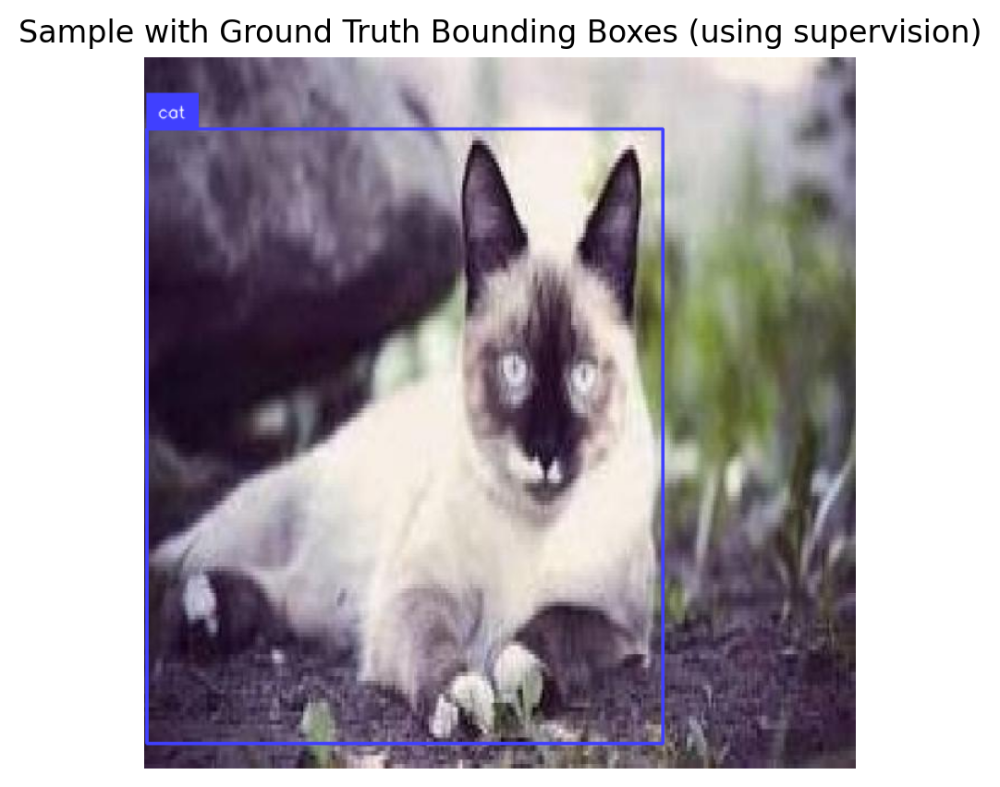

In [24]:
# Look at a sample and visualize with supervision
sample = od_dataset[0]
print(f"Image size: {sample['width']}x{sample['height']}")
print(f"Objects: {sample['objects']}")

# Convert to supervision Detections
def create_sv_detections(objects, category_names):
    """Convert dataset objects to supervision Detections."""
    bboxes = []
    class_ids = []
    
    for bbox, cat_id in zip(objects['bbox'], objects['category']):
        x, y, w, h = bbox
        # supervision uses xyxy format
        bboxes.append([x, y, x + w, y + h])
        class_ids.append(cat_id)
    
    if len(bboxes) == 0:
        return sv.Detections.empty()
    
    return sv.Detections(
        xyxy=np.array(bboxes),
        class_id=np.array(class_ids),
    )

# Create annotators
box_annotator = sv.BoxAnnotator(thickness=2)
label_annotator = sv.LabelAnnotator(text_scale=0.5, text_thickness=1)

# Annotate image
image_np = np.array(sample['image'])
detections = create_sv_detections(sample['objects'], category_names)
labels = [category_names[i] for i in detections.class_id]

annotated = box_annotator.annotate(image_np.copy(), detections)
annotated = label_annotator.annotate(annotated, detections, labels=labels)

plt.figure(figsize=(5, 5))
plt.imshow(annotated)
plt.title("Sample with Ground Truth Bounding Boxes (using supervision)", fontsize=12)
plt.axis('off')
plt.show()

## Part 3: Create Instruction Dataset

We need to convert the object detection annotations into instruction-response pairs:

**Input (Instruction):** `"What objects are in this image? Output as JSON."`

**Output (Response):** `{"objects": [{"label": "cat", "bbox": [0.1, 0.2, 0.3, 0.4]}]}`

We normalize bounding boxes to 0-1 range for consistency.

In [25]:
def create_od_json(objects, width, height, category_names):
    """Convert bounding box annotations to JSON format."""
    result = {"objects": []}
    
    for bbox, cat_id in zip(objects['bbox'], objects['category']):
        x, y, w, h = bbox
        # Normalize to 0-1 range
        norm_bbox = [
            round(x / width, 3),
            round(y / height, 3),
            round(w / width, 3),
            round(h / height, 3)
        ]
        result["objects"].append({
            "label": category_names[cat_id],
            "bbox": norm_bbox
        })
    
    return json.dumps(result)

# Test on a sample
sample = od_dataset[0]
json_output = create_od_json(sample['objects'], sample['width'], sample['height'], category_names)
print("Example JSON output:")
print(json.dumps(json.loads(json_output), indent=2))

Example JSON output:
{
  "objects": [
    {
      "label": "cat",
      "bbox": [
        0.003,
        0.1,
        0.726,
        0.864
      ]
    }
  ]
}


In [26]:
import random

# Different instruction prompts for variety
INSTRUCTION_PROMPTS = [
    "What objects are in this image? Output as JSON.",
    "Detect all objects in this image and return JSON with bounding boxes.",
    "List the objects with their locations in JSON format.",
    "Find all objects and output their bounding boxes as JSON.",
]

class ODInstructionDataset(Dataset):
    """Dataset for object detection instruction tuning."""
    
    def __init__(self, hf_dataset, image_processor, tokenizer, category_names, max_length=256):
        self.dataset = hf_dataset
        self.image_processor = image_processor
        self.tokenizer = tokenizer
        self.category_names = category_names
        self.max_length = max_length
    
    def __len__(self):
        return len(self.dataset)
    
    def __getitem__(self, idx):
        item = self.dataset[idx]
        
        # Process image
        image = item['image'].convert('RGB')
        pixel_values = self.image_processor(image, return_tensors="pt").pixel_values.squeeze(0)
        
        # Create instruction-response pair
        instruction = random.choice(INSTRUCTION_PROMPTS)
        response = create_od_json(item['objects'], item['width'], item['height'], self.category_names)
        
        # Format: "<instruction> <response>"
        full_text = f"{instruction} {response}"
        
        # Tokenize
        encoding = self.tokenizer(
            full_text,
            max_length=self.max_length,
            padding='max_length',
            truncation=True,
            return_tensors='pt'
        )
        
        input_ids = encoding['input_ids'].squeeze(0)
        attention_mask = encoding['attention_mask'].squeeze(0)
        
        # Create labels - mask the instruction part (only train on response)
        instruction_tokens = self.tokenizer.encode(instruction, add_special_tokens=False)
        instruction_len = len(instruction_tokens)
        
        labels = input_ids.clone()
        labels[:instruction_len] = -100  # Don't compute loss on instruction
        labels[attention_mask == 0] = -100  # Don't compute loss on padding
        
        return {
            'pixel_values': pixel_values,
            'input_ids': input_ids,
            'attention_mask': attention_mask,
            'labels': labels,
        }


# Create dataset and dataloader
train_dataset = ODInstructionDataset(od_dataset, image_processor, tokenizer, category_names)

train_loader = DataLoader(
    train_dataset,
    batch_size=4,
    shuffle=True,
    num_workers=0,
)

print(f"Number of training samples: {len(train_dataset)}")
print(f"Number of batches: {len(train_loader)}")

Number of training samples: 800
Number of batches: 200


In [27]:
# Verify a batch
batch = next(iter(train_loader))
print(f"Batch pixel_values shape: {batch['pixel_values'].shape}")
print(f"Batch input_ids shape: {batch['input_ids'].shape}")

# Decode first sample to see the format
print(f"\nSample text (first item):")
print(tokenizer.decode(batch['input_ids'][0], skip_special_tokens=True)[:300])

Batch pixel_values shape: torch.Size([4, 3, 224, 224])
Batch input_ids shape: torch.Size([4, 256])

Sample text (first item):
Find all objects and output their bounding boxes as JSON. {"objects": [{"label": "horse", "bbox": [0.0, 0.006, 0.658, 0.994]}]}


## Part 4: Test Before Training

Let's see what the model outputs before instruction tuning. It should produce captions (from the previous training) but not structured JSON.

In [28]:
def generate_od_response(model, image, image_processor, device, prompt="What objects are in this image? Output as JSON."):
    """Generate object detection response for an image."""
    model.eval()
    
    if not isinstance(image, Image.Image):
        image = Image.fromarray(image)
    image = image.convert('RGB')
    
    pixel_values = image_processor(image, return_tensors="pt").pixel_values.to(device)
    
    response = model.generate(
        pixel_values,
        prompt=prompt,
        max_new_tokens=150,
        temperature=0.3,
        do_sample=True,
    )
    
    return response

In [29]:
# Test on a few samples BEFORE training and STORE responses
test_indices = [0, 5, 10]
test_samples_data = []  # Store for later comparison

print("=" * 70)
print("BEFORE INSTRUCTION TUNING - Model outputs (should be captions, not JSON)")
print("=" * 70)

before_responses = []
for idx in test_indices:
    sample = od_dataset[idx]
    response = generate_od_response(vlm, sample['image'], image_processor, device)
    before_responses.append(response)
    test_samples_data.append({
        'idx': idx,
        'image': sample['image'],
        'objects': sample['objects'],
        'width': sample['width'],
        'height': sample['height'],
    })
    
    gt_json = create_od_json(sample['objects'], sample['width'], sample['height'], category_names)
    
    print(f"\nImage {idx}:")
    print(f"  Model output: {response[:100]}...")
    print(f"  Expected JSON: {gt_json[:80]}...")

BEFORE INSTRUCTION TUNING - Model outputs (should be captions, not JSON)

Image 0:
  Model output: What objects are in this image? Output as JSON.A white dog with a black collar and a black and white...
  Expected JSON: {"objects": [{"label": "cat", "bbox": [0.003, 0.1, 0.726, 0.864]}]}...

Image 5:
  Model output: What objects are in this image? Output as JSON.A group of people are sitting in a field of grass .a ...
  Expected JSON: {"objects": [{"label": "chicken", "bbox": [0.189, 0.173, 0.623, 0.827]}]}...

Image 10:
  Model output: What objects are in this image? Output as JSON.A dog with a collar and a stick .A black dog stands i...
  Expected JSON: {"objects": [{"label": "skunk", "bbox": [0.287, 0.17, 0.684, 0.695]}]}...


## Part 5: Instruction Fine-Tuning

Now let's fine-tune the model to output structured JSON for object detection.

In [30]:
def train_vlm_od(model, train_loader, num_epochs=5, lr=1e-4):
    """Train the VLM for object detection."""
    
    trainable_params = [p for p in model.parameters() if p.requires_grad]
    optimizer = torch.optim.AdamW(trainable_params, lr=lr)
    
    model.train()
    model.vision_encoder.eval()
    
    losses = []
    
    for epoch in range(num_epochs):
        epoch_loss = 0
        progress_bar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}")
        
        for batch in progress_bar:
            pixel_values = batch['pixel_values'].to(device)
            input_ids = batch['input_ids'].to(device)
            attention_mask = batch['attention_mask'].to(device)
            labels = batch['labels'].to(device)
            
            outputs = model(
                pixel_values=pixel_values,
                input_ids=input_ids,
                attention_mask=attention_mask,
                labels=labels,
            )
            
            loss = outputs.loss
            
            optimizer.zero_grad()
            loss.backward()
            torch.nn.utils.clip_grad_norm_(trainable_params, max_norm=1.0)
            optimizer.step()
            
            epoch_loss += loss.item()
            progress_bar.set_postfix({'loss': f"{loss.item():.4f}"})
        
        avg_loss = epoch_loss / len(train_loader)
        losses.append(avg_loss)
        print(f"Epoch {epoch+1} - Average Loss: {avg_loss:.4f}")
    
    return losses

In [31]:
# Train for more epochs with combined dataset
losses = train_vlm_od(vlm, train_loader, num_epochs=10, lr=1e-4)

Epoch 1/10: 100%|██████████| 200/200 [01:18<00:00,  2.56it/s, loss=0.6356]


Epoch 1 - Average Loss: 0.6747


Epoch 2/10: 100%|██████████| 200/200 [01:19<00:00,  2.53it/s, loss=0.5965]


Epoch 2 - Average Loss: 0.5833


Epoch 3/10: 100%|██████████| 200/200 [01:19<00:00,  2.52it/s, loss=0.5757]


Epoch 3 - Average Loss: 0.5554


Epoch 4/10: 100%|██████████| 200/200 [01:19<00:00,  2.53it/s, loss=0.5389]


Epoch 4 - Average Loss: 0.5244


Epoch 5/10: 100%|██████████| 200/200 [01:19<00:00,  2.53it/s, loss=0.4783]


Epoch 5 - Average Loss: 0.4837


Epoch 6/10: 100%|██████████| 200/200 [01:19<00:00,  2.52it/s, loss=0.4855]


Epoch 6 - Average Loss: 0.4204


Epoch 7/10: 100%|██████████| 200/200 [01:19<00:00,  2.52it/s, loss=0.4627]


Epoch 7 - Average Loss: 0.3318


Epoch 8/10: 100%|██████████| 200/200 [01:18<00:00,  2.54it/s, loss=0.2732]


Epoch 8 - Average Loss: 0.2492


Epoch 9/10: 100%|██████████| 200/200 [01:19<00:00,  2.53it/s, loss=0.1727]


Epoch 9 - Average Loss: 0.1723


Epoch 10/10: 100%|██████████| 200/200 [01:18<00:00,  2.53it/s, loss=0.0934]

Epoch 10 - Average Loss: 0.1242


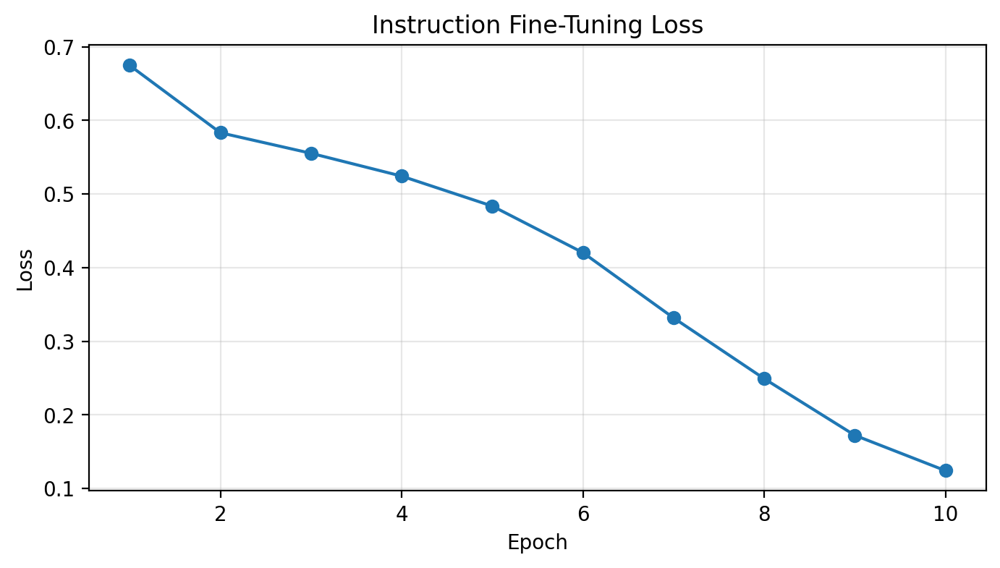

In [32]:
# Plot training loss
plt.figure(figsize=(8, 4))
plt.plot(range(1, len(losses)+1), losses, marker='o')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Instruction Fine-Tuning Loss')
plt.grid(True, alpha=0.3)
plt.show()

## Part 6: Test After Training

Let's compare the outputs before and after instruction tuning!

In [33]:
# Test on the same samples AFTER training - compare with BEFORE
print("=" * 70)
print("COMPARISON: BEFORE vs AFTER INSTRUCTION TUNING")
print("=" * 70)

after_responses = []
for i, (sample_data, before_resp) in enumerate(zip(test_samples_data, before_responses)):
    response = generate_od_response(vlm, sample_data['image'], image_processor, device)
    after_responses.append(response)
    
    gt_json = create_od_json(sample_data['objects'], sample_data['width'], sample_data['height'], category_names)
    
    print(f"\n{'='*70}")
    print(f"Image {sample_data['idx']}:")
    print(f"{'='*70}")
    print(f"BEFORE (caption model):  {before_resp[:120]}...")
    print(f"AFTER (instruction-tuned): {response[:120]}...")
    print(f"GROUND TRUTH:              {gt_json[:120]}...")

COMPARISON: BEFORE vs AFTER INSTRUCTION TUNING

Image 0:
BEFORE (caption model):  What objects are in this image? Output as JSON.A white dog with a black collar and a black and white dog with a blue col...
AFTER (instruction-tuned): What objects are in this image? Output as JSON. {"objects": [{"label": "cat", "bbox": [0.003, 0.0, 0.827, 0.963]}]}]}]}]...
GROUND TRUTH:              {"objects": [{"label": "cat", "bbox": [0.003, 0.1, 0.726, 0.864]}]}...

Image 5:
BEFORE (caption model):  What objects are in this image? Output as JSON.A group of people are sitting in a field of grass .a dog runs with a ball...
AFTER (instruction-tuned): What objects are in this image? Output as JSON. {"objects": [{"label": "chicken", "bbox": [0.059, 0.077, 0.334, 0.653]},...
GROUND TRUTH:              {"objects": [{"label": "chicken", "bbox": [0.189, 0.173, 0.623, 0.827]}]}...

Image 10:
BEFORE (caption model):  What objects are in this image? Output as JSON.A dog with a collar and a stick .A black dog sta

In [34]:
def parse_od_response(response):
    """Try to parse JSON from model response."""
    try:
        # Find JSON in response
        start = response.find('{')
        if start == -1:
            return None
        
        # Find the matching closing brace by counting braces
        brace_count = 0
        end = start
        for i, char in enumerate(response[start:], start):
            if char == '{':
                brace_count += 1
            elif char == '}':
                brace_count -= 1
                if brace_count == 0:
                    end = i + 1
                    break
        
        if end > start:
            json_str = response[start:end]
            return json.loads(json_str)
    except Exception as e:
        # Try a simpler approach - just find first complete JSON object
        try:
            start = response.find('{"objects"')
            if start != -1:
                # Find closing bracket pattern
                end = response.find(']}', start)
                if end != -1:
                    json_str = response[start:end+2]
                    return json.loads(json_str)
        except:
            pass
    return None

# Test the parser
test_response = 'What objects are in this image? Output as JSON. {"objects": [{"label": "cat", "bbox": [0.022, 0.006, 0.773, 0.994]}]}]}]...'
parsed = parse_od_response(test_response)
print(f"Test parsing: {parsed}")

def create_sv_detections_from_json(parsed_json, width, height, category_names):
    """Convert parsed JSON to supervision Detections."""
    if not parsed_json or 'objects' not in parsed_json:
        return sv.Detections.empty(), []
    
    bboxes = []
    class_ids = []
    labels_list = []
    
    # Create a reverse mapping from label to category id
    label_to_id = {name: i for i, name in enumerate(category_names)}
    
    for obj in parsed_json['objects']:
        try:
            nx, ny, nw, nh = obj['bbox']
            # Denormalize and convert to xyxy
            x1 = nx * width
            y1 = ny * height
            x2 = (nx + nw) * width
            y2 = (ny + nh) * height
            bboxes.append([x1, y1, x2, y2])
            
            label = obj['label']
            labels_list.append(label)
            class_ids.append(label_to_id.get(label, 0))
        except:
            continue
    
    if len(bboxes) == 0:
        return sv.Detections.empty(), []
    
    return sv.Detections(
        xyxy=np.array(bboxes),
        class_id=np.array(class_ids),
    ), labels_list

def visualize_comparison_sv(image, response, gt_objects, width, height, category_names, title=""):
    """Visualize predicted vs ground truth using supervision."""
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 7))
    image_np = np.array(image)
    
    # Create annotators with different colors
    gt_box_annotator = sv.BoxAnnotator(thickness=3, color=sv.Color.GREEN)
    gt_label_annotator = sv.LabelAnnotator(text_scale=0.6, text_thickness=2, color=sv.Color.GREEN)
    
    pred_box_annotator = sv.BoxAnnotator(thickness=3, color=sv.Color.RED)
    pred_label_annotator = sv.LabelAnnotator(text_scale=0.6, text_thickness=2, color=sv.Color.RED)
    
    # Ground truth (left)
    gt_detections = create_sv_detections(gt_objects, category_names)
    gt_labels = [category_names[i] for i in gt_detections.class_id]
    
    gt_annotated = gt_box_annotator.annotate(image_np.copy(), gt_detections)
    gt_annotated = gt_label_annotator.annotate(gt_annotated, gt_detections, labels=gt_labels)
    
    ax1.imshow(gt_annotated)
    ax1.set_title("Ground Truth", fontsize=14, color='green', fontweight='bold')
    ax1.axis('off')
    
    # Predictions (right)
    parsed = parse_od_response(response)
    pred_annotated = image_np.copy()
    
    if parsed and 'objects' in parsed:
        pred_detections, pred_labels = create_sv_detections_from_json(parsed, width, height, category_names)
        if len(pred_detections) > 0:
            pred_annotated = pred_box_annotator.annotate(pred_annotated, pred_detections)
            pred_annotated = pred_label_annotator.annotate(pred_annotated, pred_detections, labels=pred_labels)
        ax2.set_title("Model Predictions", fontsize=14, color='red', fontweight='bold')
    else:
        ax2.set_title("Model Predictions (Failed to parse)", fontsize=14, color='red', fontweight='bold')
    
    ax2.imshow(pred_annotated)
    ax2.axis('off')
    
    if title:
        plt.suptitle(title, fontsize=16, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.show()
    
    return parsed

Test parsing: {'objects': [{'label': 'cat', 'bbox': [0.022, 0.006, 0.773, 0.994]}]}



Image 0
BEFORE: What objects are in this image? Output as JSON.A white dog w...
AFTER:  What objects are in this image? Output as JSON. {"objects": ...


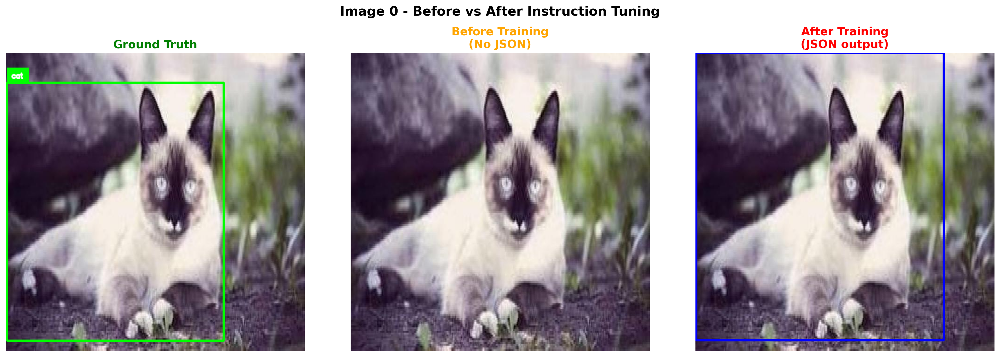


Image 5
BEFORE: What objects are in this image? Output as JSON.A group of pe...
AFTER:  What objects are in this image? Output as JSON. {"objects": ...


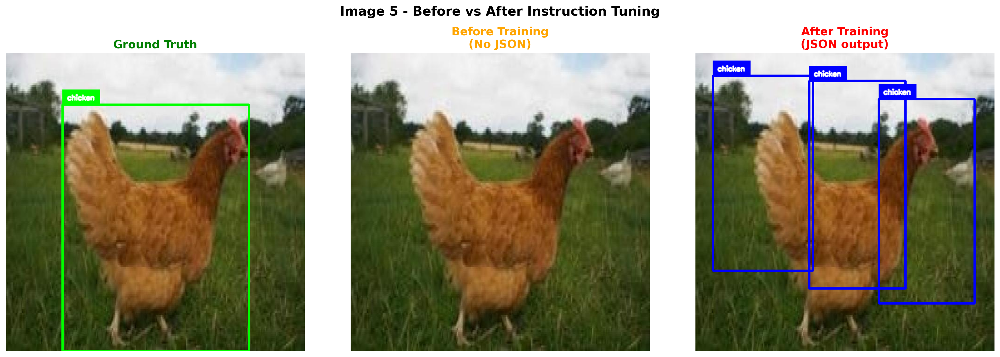


Image 10
BEFORE: What objects are in this image? Output as JSON.A dog with a ...
AFTER:  What objects are in this image? Output as JSON. {"objects": ...


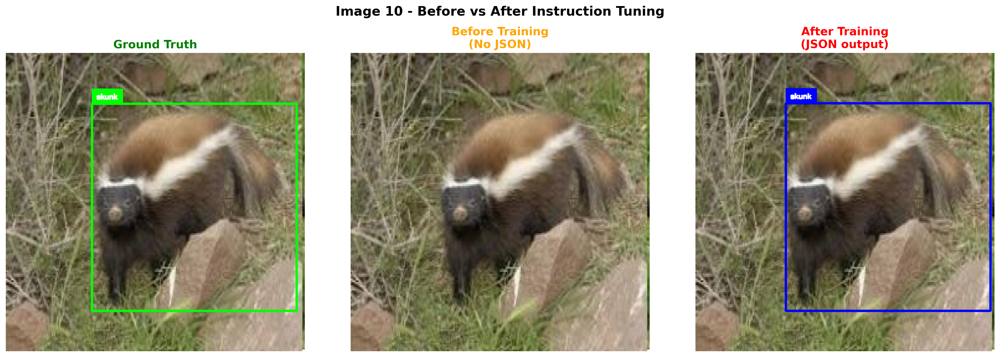

In [35]:
# Visual comparison: BEFORE vs AFTER using supervision
# Shows 3 columns: Ground Truth, Before Training, After Training

def visualize_before_after_sv(image, before_response, after_response, gt_objects, width, height, category_names, title=""):
    """Visualize Ground Truth vs Before vs After using supervision."""
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    image_np = np.array(image)
    
    # Annotators
    gt_box = sv.BoxAnnotator(thickness=3, color=sv.Color.GREEN)
    gt_label = sv.LabelAnnotator(text_scale=0.5, text_thickness=2, color=sv.Color.GREEN)
    pred_box = sv.BoxAnnotator(thickness=3, color=sv.Color.RED)
    pred_label = sv.LabelAnnotator(text_scale=0.5, text_thickness=2, color=sv.Color.RED)
    
    # 1. Ground Truth
    gt_detections = create_sv_detections(gt_objects, category_names)
    gt_labels = [category_names[i] for i in gt_detections.class_id]
    gt_img = gt_box.annotate(image_np.copy(), gt_detections)
    gt_img = gt_label.annotate(gt_img, gt_detections, labels=gt_labels)
    axes[0].imshow(gt_img)
    axes[0].set_title("Ground Truth", fontsize=14, color='green', fontweight='bold')
    axes[0].axis('off')
    
    # 2. Before Training (likely won't have valid JSON)
    before_parsed = parse_od_response(before_response)
    before_img = image_np.copy()
    if before_parsed and 'objects' in before_parsed:
        before_det, before_labels = create_sv_detections_from_json(before_parsed, width, height, category_names)
        if len(before_det) > 0:
            before_img = pred_box.annotate(before_img, before_det)
            before_img = pred_label.annotate(before_img, before_det, labels=before_labels)
    axes[1].imshow(before_img)
    axes[1].set_title("Before Training\n(No JSON)", fontsize=14, color='orange', fontweight='bold')
    axes[1].axis('off')
    
    # 3. After Training
    after_parsed = parse_od_response(after_response)
    after_img = image_np.copy()
    if after_parsed and 'objects' in after_parsed:
        after_det, after_labels = create_sv_detections_from_json(after_parsed, width, height, category_names)
        if len(after_det) > 0:
            after_img = pred_box.annotate(after_img, after_det)
            after_img = pred_label.annotate(after_img, after_det, labels=after_labels)
        axes[2].set_title("After Training\n(JSON output)", fontsize=14, color='red', fontweight='bold')
    else:
        axes[2].set_title("After Training\n(Parse failed)", fontsize=14, color='red', fontweight='bold')
    axes[2].imshow(after_img)
    axes[2].axis('off')
    
    if title:
        plt.suptitle(title, fontsize=16, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.show()

# Visualize before/after for all test samples
for i, (sample_data, before_resp, after_resp) in enumerate(zip(test_samples_data, before_responses, after_responses)):
    print(f"\n{'='*70}")
    print(f"Image {sample_data['idx']}")
    print(f"BEFORE: {before_resp[:60]}...")
    print(f"AFTER:  {after_resp[:60]}...")
    print(f"{'='*70}")
    
    visualize_before_after_sv(
        sample_data['image'],
        before_resp,
        after_resp,
        sample_data['objects'],
        sample_data['width'],
        sample_data['height'],
        category_names,
        title=f"Image {sample_data['idx']} - Before vs After Instruction Tuning"
    )

## Part 7: Test on New Images

Let's test on some images from the validation set that the model hasn't seen.

Test set size: 200

Test Image 0
Model output: What objects are in this image? Output as JSON. {"objects": [{"label": "cow", "bbox": [0.091, 0.291, 0.309, 0.623]}, {"label": "cow", "bbox": [0.308, 0.208, 0.382, 0.762]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}
Ground truth: {"objects": [{"label": "cow", "bbox": [0.202, 0.455, 0.618, 0.545]}, {"label": "cow", "bbox": [0.186, 0.416, 0.146, 0.142]}, {"label": "cow", "bbox": [0.463, 0.438, 0.181, 0.137]}, {"label": "cow", "bbox": [0.739, 0.444, 0.261, 0.193]}]}


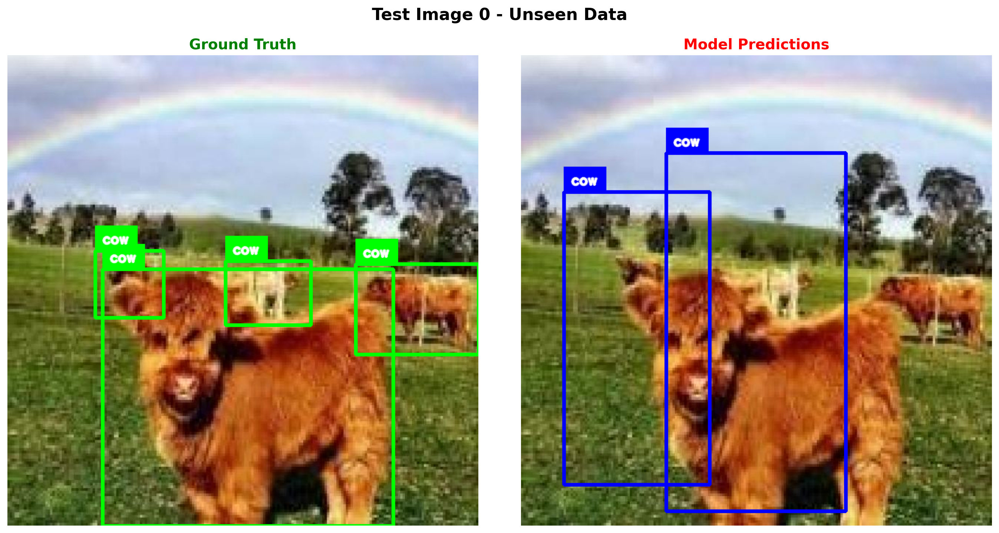


Test Image 5
Model output: What objects are in this image? Output as JSON. {"objects": [{"label": "person", "bbox": [0.109, 0.234, 0.273, 0.768]}, {"label": "person", "bbox": [0.489, 0.234, 0.156, 0.731]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}
Ground truth: {"objects": [{"label": "person", "bbox": [0.341, 0.278, 0.252, 0.722]}, {"label": "person", "bbox": [0.562, 0.291, 0.126, 0.335]}, {"label": "person", "bbox": [0.778, 0.222, 0.134, 0.494]}, {"label": "person", "bbox": [0.244, 0.398, 0.109, 0.367]}]}


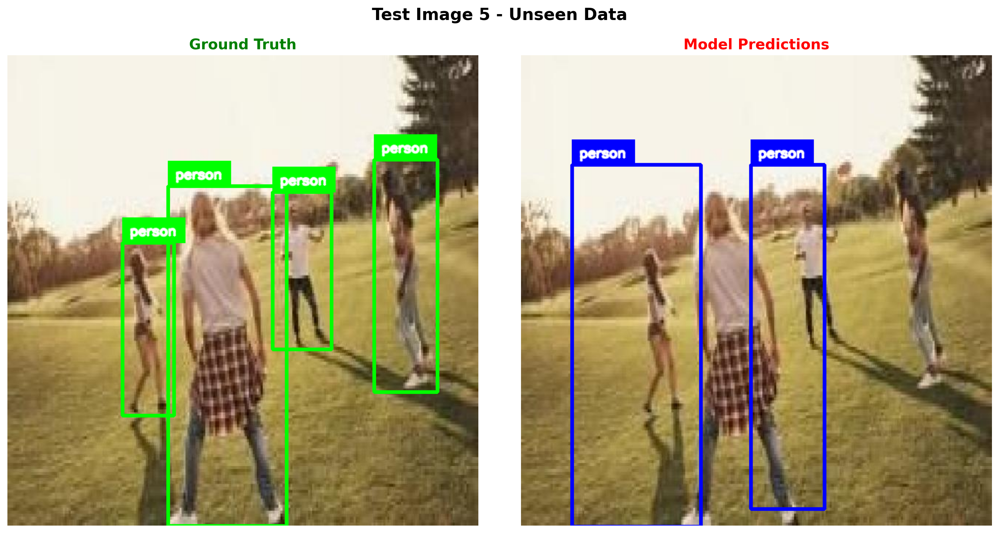


Test Image 10
Model output: What objects are in this image? Output as JSON. {"objects": [{"label": "cat", "bbox": [0.244, 0.013, 0.647, 0.975]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}]}
Ground truth: {"objects": [{"label": "cat", "bbox": [0.091, 0.006, 0.402, 0.98]}]}


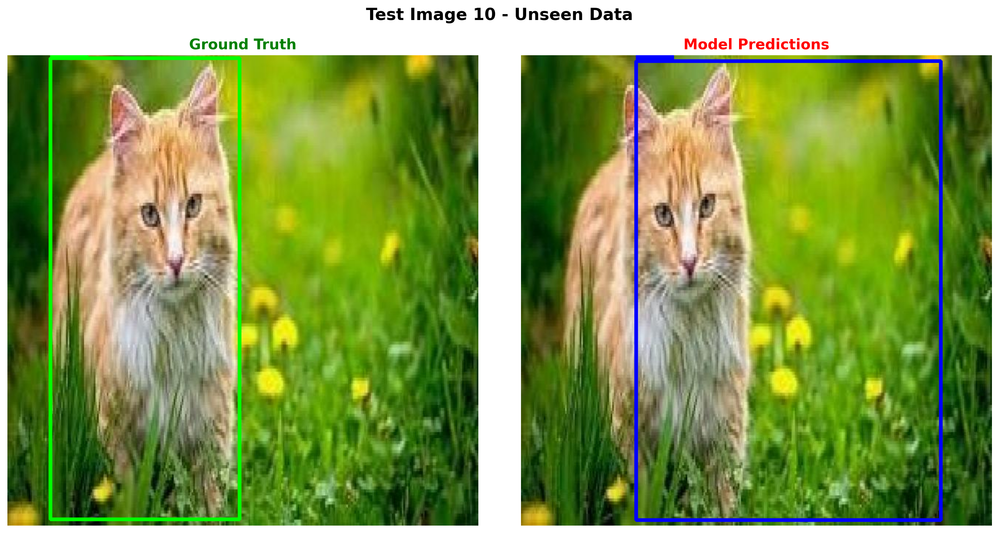

In [36]:
# Load TEST set (completely unseen) for final evaluation
test_dataset = load_dataset('Francesco/animals-ij5d2', split='test')
print(f"Test set size: {len(test_dataset)}")

# Test on a few test images
for idx in [0, 5, 10]:
    if idx >= len(test_dataset):
        continue
    sample = test_dataset[idx]
    response = generate_od_response(vlm, sample['image'], image_processor, device)
    
    gt_json = create_od_json(sample['objects'], sample['width'], sample['height'], category_names)
    
    print(f"\n{'='*70}")
    print(f"Test Image {idx}")
    print(f"Model output: {response}")
    print(f"Ground truth: {gt_json}")
    print(f"{'='*70}")
    
    visualize_comparison_sv(
        sample['image'], 
        response, 
        sample['objects'], 
        sample['width'], 
        sample['height'],
        category_names,
        title=f"Test Image {idx} - Unseen Data"
    )

## Part 8: Save the Fine-Tuned Model

In [37]:
# Save the instruction-tuned model
save_dir = "mini-vlm-od"
os.makedirs(save_dir, exist_ok=True)

torch.save({
    'projector_state_dict': vlm.projector.state_dict(),
    'language_model_state_dict': vlm.language_model.state_dict(),
    'config': {
        'vision_model_name': vision_model_name,
        'lm_model_name': lm_model_name,
        'vision_dim': vision_dim,
        'language_dim': language_dim,
    },
    'od_config': {
        'category_names': category_names,
        'instruction_prompts': INSTRUCTION_PROMPTS,
    }
}, f"{save_dir}/mini_vlm_od.pt")

tokenizer.save_pretrained(f"{save_dir}/tokenizer")
image_processor.save_pretrained(f"{save_dir}/image_processor")

print(f"Model saved to {save_dir}/")
print(f"Contents: {os.listdir(save_dir)}")

Model saved to mini-vlm-od/
Contents: ['tokenizer', 'mini_vlm_od.pt', 'image_processor']


## Summary

We successfully instruction fine-tuned our VLM for object detection:

### What We Did

1. **Loaded pretrained VLM** from the captioning notebook
2. **Created instruction dataset** that converts bounding boxes to JSON format
3. **Combined train + validation** data (800 images) for more training data
4. **Fine-tuned for 10 epochs** to learn JSON output format
5. **Tested** on held-out test set (unseen images)

### Key Insights

- **Instruction format matters**: Using varied prompts helps generalization
- **Label masking**: Only computing loss on the response (not instruction) is important
- **JSON output**: Teaching models to output structured data is feasible even with small models
- **Normalized coordinates**: Using 0-1 range makes the model resolution-independent
- **More data + epochs**: Combining datasets and training longer improves JSON formatting

### Limitations

- Small training set (800 images)
- Limited object categories
- Bounding box accuracy is approximate (educational, not production-ready)
- No IoU or mAP evaluation (could be added)

### Next Steps

1. Add proper evaluation metrics (IoU, mAP)
2. Try larger datasets (COCO)
3. Experiment with more complex output formats
4. Add visual grounding ("Where is the cat?")

## References

- [Previous notebook: Building a Minimal VLM from Scratch](2025-12-24-minimal-vlm-from-scratch.html)
- [Kosmos-2: Grounding Multimodal Large Language Models](https://arxiv.org/abs/2306.14824)
- [Florence-2: Advancing a Unified Representation](https://arxiv.org/abs/2311.06242)
- [Animals Detection Dataset](https://huggingface.co/datasets/Francesco/animals-ij5d2)
- [Hugging Face Object Detection Guide](https://huggingface.co/docs/datasets/en/object_detection)